## <p style = "font-size:100%;padding:10px 0px 10px 30px;font-weight: 400;font-family:serifs; letter-spacing: 2px; border: 3px solid yellow; color: brown; background-color:#d3d3d3; border-radius:30px 0px">1.Importing Libraries</p>

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

from scipy.stats import shapiro

from colorama import Style, Fore
blk = Style.BRIGHT + Fore.BLACK
gld = Style.BRIGHT + Fore.YELLOW
grn = Style.BRIGHT + Fore.GREEN
red = Style.BRIGHT + Fore.RED
blu = Style.BRIGHT + Fore.BLUE
white = Style.BRIGHT +Fore.WHITE
cyan = Style.BRIGHT +Fore.CYAN
magenta = Style.BRIGHT +Fore.MAGENTA
res = Style.RESET_ALL

plt.rcParams['figure.dpi'] = 800
plt.rcParams['savefig.dpi'] = 800

sns.set(rc={"figure.dpi":800, 'savefig.dpi':800})
sns.set_context('notebook')
sns.set_style("ticks")

font_title = {
    'size': 20,
    'weight': 'bold',  # You can use 'weight' here instead of 'fontweight'
    'color': 'brown',
    'fontfamily': 'serif'
}
font_sub_title = {'family': 'serif',
        'color':  'brown',
        'weight': 'bold',
        'size': 16,
        }
font_label = {'family': 'serif',
        'color':  'brown',
        'weight': 'bold',
        'size': 16,
        }

## <p style = "font-size:100%;padding:10px 0px 10px 30px;font-weight: 400;font-family:serifs; letter-spacing: 2px; border: 3px solid yellow; color: brown; background-color:#d3d3d3; border-radius:30px 0px">2.Read & Understand Data</p>

### <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 3px; color:brown; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid brown">2.1 Data</p>

In [2]:
df = pd.read_csv("data/car_mpg.csv")
df.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_type,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,0,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,0,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,0,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,0,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,0,ford torino


**The dataset** for this excersize is car performance over mileage, Our task is to predict the target `mpg` of car listed in dataset.

>**Context**:
`Miles per Gallon(mpg)` is the most factor to determine how effcient the car in fuel consumption when compared to other cars. There are several factors affect the 'mpg' like road conditions, wind, temperature externally. But internally factors like engine displacement, weight, number of cylinders etc can also be very crusical in determing the `mpg`.

>mpg data is collected for various internal factors of various different cars.
 
There are 9 independent variables :

* `cyl`: nos Number of engine cylinders in engine.
* `disp`: cc Engine Displacement.
* `hp`: HP Horse Power.
* `wt`: kgs Weight.
* `acc`: m/s2 Acceleration.
* `yr`: YYYY Year made.
* `origin`:  Origin.
* `car_type`:  Car Type.
* `car_name`:  Car Name.

Target varibale:
* `mpg`: mpg/kmpl The fuel consumption per gallon.

**Metrics**:
* [MAE](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_absolute_error.html).

In [3]:
null_sum = df.isnull().sum().sum()
dup_sum = df.duplicated().sum()
print(f"{cyan}Total number of {red}Rows{res}    : {red}{df.shape[0]}")
print(f"{cyan}Total number of {red}Columns{res} : {red}{df.shape[1]}{res}")
print("-"*80)
print("Checking for Null values")
print(f"{cyan}Total number of {red}Null values{res} {cyan}present in all Columns : {red}{null_sum}{res}")
print("-"*80)
print("Checking for Duplicate values")
print(f"{cyan}Total number of {red}duplicates{res} {cyan}present in all Columns  : {red}{dup_sum}{res}")

Total number of Rows    : 398
Total number of Columns : 10
--------------------------------------------------------------------------------
Checking for Null values
Total number of Null values present in all Columns : 0
--------------------------------------------------------------------------------
Checking for Duplicate values
Total number of duplicates present in all Columns  : 0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 10 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    object 
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_type  398 non-null    int64  
 9   car_name  398 non-null    object 
dtypes: float64(3), int64(5), object(2)
memory usage: 31.2+ KB


>Summary of Data

* The dataset has 9 independant variables and 1 dependant variable.
* `Null` values have `NOT` been found.
* `Duplicates` values `NOT` been found.

- **The dataset** contains three distinct `datatypes`.
  - float
  - int
  - object

* `hp` column which is found to be numerical, but its datatype is found to be object.
* `?` was detected in hp` column.

>Changes Moving forward

* Replacing `?` with `np.NaN`
* converting hp to `float64`
* Imputing np.NaN with mean value

In [5]:
# Use a lambda function to check if any value is only alphabetic
df['hp_mod'] = df['hp'].apply(lambda x: x if x.isdecimal() else np.NaN)
df['hp_mod'] = df['hp_mod'].astype("float64")
mean_val = df['hp_mod'].mean()
df['hp_mod'] = df['hp_mod'].replace(np.NaN,mean_val)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    object 
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_type  398 non-null    int64  
 9   car_name  398 non-null    object 
 10  hp_mod    398 non-null    float64
dtypes: float64(4), int64(5), object(2)
memory usage: 34.3+ KB


### <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 3px; color:brown; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid brown">2.2 python functions</p>

In [7]:
def dist_plots(data:pd.DataFrame) -> None:
    
    """Provides plot of Histogram * Boxplot for given data and also saves image.
    
    Args: 
        arg_1 (DataFrame): This DatFrame is used to plot and save Histogram & Boxplot o data. 
 
    Returns: 
        None 
        Simply Plots Histogram & Boxplot and saves the same image. 
        
    """
    shapiro_stat, shapiro_p = shapiro(data)
    
    # Creating a new figure with width = 12 inches and height = 4 inches
    fig, axes = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={'width_ratios': [2, 1]}, layout = "constrained")


    # Plot the histogram on the first subplot (wider subplot)
    sns.histplot(data, bins=20, color='#f0ab62', edgecolor='black', kde=True, ax=axes[0])
    axes[0].lines[0].set_color('crimson')
    axes[0].grid(axis='x', color='#f09a3e')
    axes[0].set_title('Histogram Plot',fontdict=font_sub_title)
    axes[0].tick_params(labelcolor='brown', labelsize='medium', width=5)
    axes[0].set_xlabel('Bins',fontdict = font_label)
    axes[0].set_ylabel('Count',fontdict = font_label)
    


    # Plot the boxplot on the second subplot
    sns.boxplot(data, color='#f0ab62', ax=axes[1], flierprops={'markerfacecolor': 'crimson', 'markeredgecolor': 'black'})
    axes[1].set_title('Boxplot',fontdict=font_sub_title)
    
    col_name = data.name

    # Adding a title to the entire figure
    fig.suptitle('Distribution and Boxplot for -->'+col_name.upper()+"\n Normal p_val = {:.4f}".format(shapiro_p), fontsize = 18, fontweight='bold', fontfamily='serif')

    plt.tight_layout()  # Ensures the subplots don't overlap
    
    
    path = "static/plots/dist_plots/"+col_name+".jpg"

    plt.savefig(path, bbox_inches="tight")
    plt.show()
print(dist_plots.__doc__)

Provides plot of Histogram * Boxplot for given data and also saves image.
    
    Args: 
        arg_1 (DataFrame): This DatFrame is used to plot and save Histogram & Boxplot o data. 
 
    Returns: 
        None 
        Simply Plots Histogram & Boxplot and saves the same image. 
        
    


In [8]:
def bi_plots(df:pd.DataFrame,col:str,target:str) -> None:
    
    """Provides plot of Pie Chart for given data and also saves image.
    
    Args: 
        arg_1 (DataFrame): This DatFrame is used to plot and save Pie Chart. 
 
    Returns: 
        None 
        Simply Plots Pie Chart and saves the same image. 
        
    """

    df_avg = df.groupby(col)[target].mean()
    df_sum = df.groupby(col)[target].sum()
    df_cnt = df.groupby(col)[target].count()
    
    exp_len = len(df_avg)-1
    lst = [0 for i in range(exp_len)]
    lst.append(0.1)

    fig, ax = plt.subplots(1, 3, figsize=(12, 4), layout = "constrained")
    explode = tuple(lst)
    text_props = {'fontsize': 12, 'weight': 'bold', 'font': 'Serif'}
    
    
    ax[0].pie(df_avg, labels=df_avg.index, autopct='%1.1f%%', explode=explode,startangle=90, textprops=text_props)
    ax[0].set_xlabel("Average %",fontdict = font_label)
    ax[0].add_artist(plt.Circle((0,0),0.3,fc='white'))

    ax[1].pie(df_sum, labels=df_sum.index, autopct='%1.1f%%', explode=explode,startangle=90, textprops=text_props)
    ax[1].set_xlabel("Sum %",fontdict = font_label)
    ax[1].add_artist(plt.Circle((0,0),0.3,fc='white'))

    ax[2].pie(df_cnt, labels=df_cnt.index, autopct='%1.1f%%', explode=explode, startangle=45, textprops=text_props)
    ax[2].set_xlabel("Count %",fontdict = font_label)
    ax[2].add_artist(plt.Circle((0,0),0.3,fc='white'))
    
    col_name = df[col].name

    # Adding a title to the entire figure
    fig.suptitle('Pie Chart for -->'+col_name.upper(), fontsize = 18, fontweight='bold', fontfamily='serif')

    plt.tight_layout()  # Ensures the subplots don't overlap
        
    path = "static/plots/bi_plots/"+col_name+".jpg"

    plt.savefig(path, bbox_inches="tight")
    plt.show()

In [9]:
from typing import List

def pair_plots(df:pd.DataFrame,cols:List) -> None:
    
    """Provides Pair plot  for given data and also saves image.
    
    Args: 
        arg_1 (DataFrame): This DatFrame is used to plot and save Pair Plot Chart. 
        arg_2 (cols)     : This is list of columns needed for pair plot Chart. 
 
    Returns: 
        None 
        Simply Plots Pair Plot Chart and saves the same image. 
        
    """
    
    plt.figure(figsize=(10,10))
  
    sns.pairplot(df[cols], diag_kind='kde', plot_kws={'color': '#f0ab62'}, diag_kws={'color':'#f0ab62'}) 
    plt.title("Pair Plot") 
    
    
    col_name ="pairplot"    
    path = "static/plots/bi_plots/"+col_name+".jpg"
    
    plt.tight_layout()  # Ensures the subplots don't overlap

    plt.savefig(path, bbox_inches="tight")
    plt.show()

In [10]:
def bar_plots(df:pd.DataFrame,x:str,y:str) -> None:
    
    """Provides Bar plot  for given data and also saves image.
    
    Args: 
        arg_1 (DataFrame): This DatFrame is used to plot and save Bar Plot Chart. 
        arg_2 (x)     : This is string as column name. 
        arg_3 (y)     : This is string as column name. 
 
    Returns: 
        None 
        Simply Plots Bar Plot Chart and saves the same image. 
        
    """

    fig , ax = plt.subplots(figsize=(15,5))
    
    sns.barplot(df,x = x, y = y, ax=ax,estimator='sum',)
    ax.set_xlabel("Year", fontdict=font_label)
    ax.set_ylabel("Miles Per gallon", fontdict=font_label)
    ax.tick_params(labelsize = 14, labelcolor="brown", width=2)
    
    col_name = str(x)+"_vs_"+str(y)
    ax.set_title("Bar Plot "+col_name, fontsize = 18, fontweight='bold', fontfamily='serif') 
    path = "static/plots/bi_plots/"+col_name+".jpg"    
    plt.tight_layout()  # Ensures the subplots don't overlap
    plt.savefig(path, bbox_inches="tight")
    
    plt.show()

In [11]:
def cat_plots(df: pd.DataFrame, x: str, y: str, col: str, hue: str, kind: str, palette: str) -> None:
    """Provides cat plot for given data and also saves the image.

    Args:
        df (DataFrame): DataFrame to plot and save the Cat Plot.
        x (str): Column name for x-axis.
        y (str): Column name for y-axis.
        col (str): Column name for granular in column.
        hue (str): Column name for granular in each plot.
        kind (str): Type of plot.
        palette (str): Color palette for hue.

    Returns:
        None.
        Simply plots the Cat Plot and saves the image.

    """
    plt.figure(figsize=(15, 5))

    # Create the Cat Plot
    cat_plot = sns.catplot(data=df, y=y, x=x, col=col, hue=hue, kind=kind, palette=palette)

    # Set the x-tick labels, x-label, and y-label color to brown
    cat_plot.set_xticklabels(color='brown')
    cat_plot.set_yticklabels(color='brown')
    cat_plot.set_xlabels(color='brown')
    cat_plot.set_ylabels(color='brown')

    col_name = str(x) + "_vs_" + str(y)

    # Get the figure from the FacetGrid
    fig = cat_plot.fig

    # Set the overall title for the entire facet grid
    fig.suptitle("Multivariate Plot " + col_name, fontdict=font_sub_title)

    path = "static/plots/multi_plots/" + col_name + ".jpg"
    plt.tight_layout()
    plt.savefig(path, bbox_inches="tight")
    plt.show()


In [33]:
def correlation_plot(df: pd.DataFrame,  method_: str, title_name: str='Correlation Plot') -> None:
    """Draws the correlation heatmap plot.
    
    Args:
        df: train or test dataframes
        method_: pearson, kendall, spearman
        
    Returns:
        Plots Correlation plot for given method
    """
    
    cmap_ = ["#f08a05","#dba660","#e3c8a6","#f7eee1","#d8f2ae","#528204"]

    corr = df.corr(method= method_)
    
    fig, axes = plt.subplots(figsize=(8, 3))
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    
    sns.heatmap(corr, mask=mask, linewidths=.5, cmap=cmap_, annot=True)
    plt.title(title_name+ " for --> "+ str(method_))
    
    path = "static/plots/bi_plots/" + title_name+"_"+ str(method_) + ".jpg"
    plt.tight_layout()
    plt.savefig(path, bbox_inches="tight")
    plt.show()

### <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 3px; color:brown; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid brown">2.3 Univariate Analysis</p>

In [13]:
for col in df.columns:
    print(f"For column {col} num of Unique values are    :{df[col].nunique()}")

For column mpg num of Unique values are    :129
For column cyl num of Unique values are    :5
For column disp num of Unique values are    :82
For column hp num of Unique values are    :94
For column wt num of Unique values are    :351
For column acc num of Unique values are    :95
For column yr num of Unique values are    :13
For column origin num of Unique values are    :3
For column car_type num of Unique values are    :2
For column car_name num of Unique values are    :305
For column hp_mod num of Unique values are    :94


In [14]:
round(df.describe().T,3)

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.515,7.816,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.455,1.701,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.426,104.270,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.425,846.842,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568,2.758,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010,3.698,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.573,0.802,1.0,1.000,1.0,2.000,3.0
car_type,398.0,0.530,0.500,0.0,0.000,1.0,1.000,1.0
hp_mod,398.0,104.469,38.199,46.0,76.000,95.0,125.000,230.0


In [15]:
nom_data = ['cyl','yr','origin','car_type']

for nomCol in nom_data:
    print(round(df.groupby(nomCol)['mpg'].agg(['count','sum','mean']),2))
    print("-"*80)

     count     sum   mean
cyl                      
3        4    82.2  20.55
4      204  5974.5  29.29
5        3    82.1  27.37
6       84  1678.8  19.99
8      103  1541.2  14.96
--------------------------------------------------------------------------------
    count    sum   mean
yr                     
70     29  513.0  17.69
71     28  595.0  21.25
72     28  524.0  18.71
73     40  684.0  17.10
74     27  613.0  22.70
75     30  608.0  20.27
76     34  733.5  21.57
77     28  654.5  23.38
78     36  866.2  24.06
79     29  727.7  25.09
80     29  977.2  33.70
81     29  879.7  30.33
82     31  983.0  31.71
--------------------------------------------------------------------------------
        count     sum   mean
origin                      
1         249  5000.8  20.08
2          70  1952.4  27.89
3          79  2405.6  30.45
--------------------------------------------------------------------------------
          count     sum   mean
car_type                      
0       

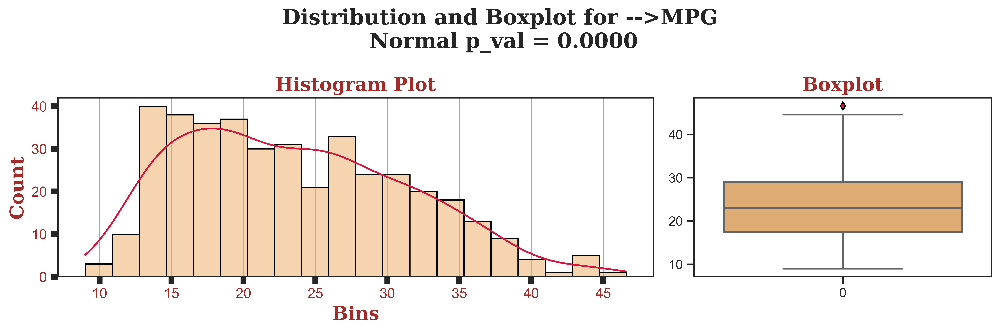

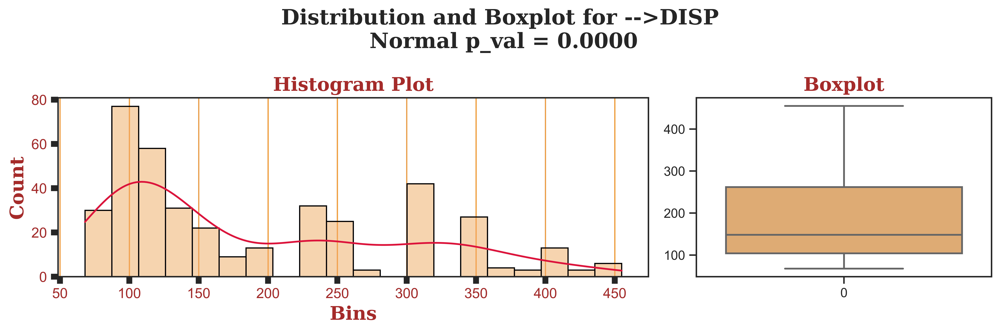

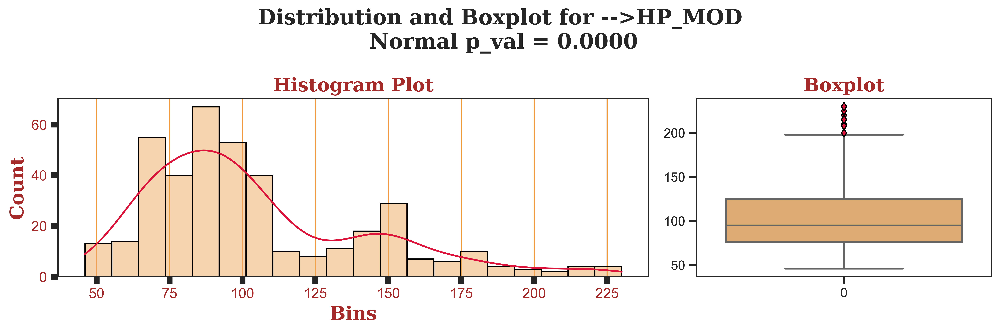

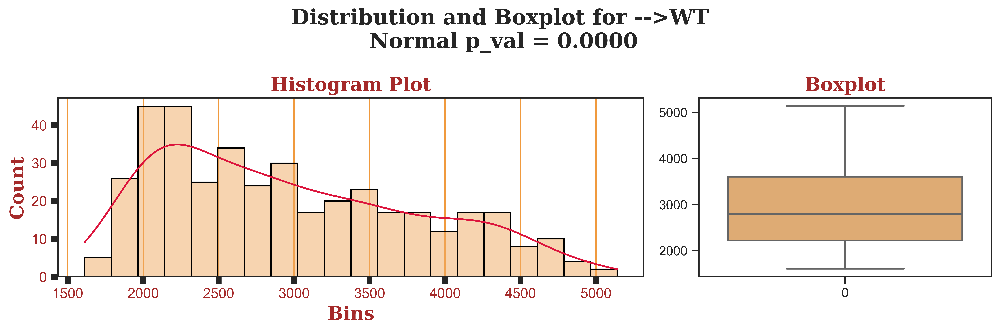

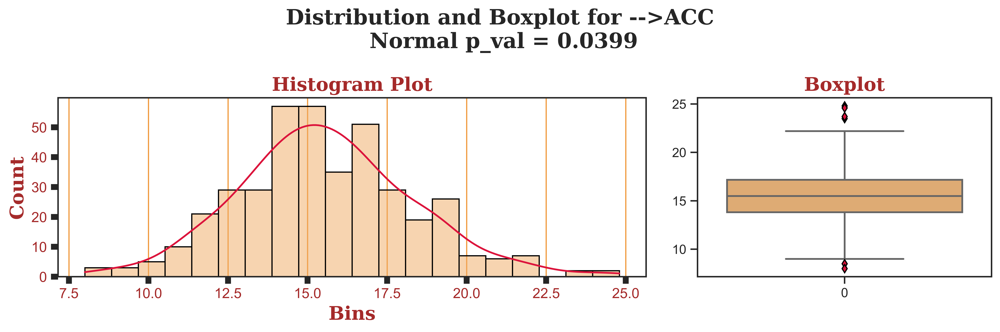

In [16]:
cont_cols = ['mpg','disp','hp_mod','wt','acc']
for col in cont_cols:
    dist_plots(df[col])

>Summary of Univariate Analysis

* **Descriptive**

  * The data has nominal, ordinal and continuous data.
  * mpg of all cars in range  of min value = 9  and max value = 46.6
  * engine cylinders of all cars in range  of min value = 3  and max value = 8
  * year made of all cars in range  of min value = 70  and max value = 82
  * Weight of cars in range  of min value = 1.6T  and max value = 5.2T


* **Univariate**

  * All distributions are not Normal
  * outliers were present

### <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 3px; color:brown; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid brown">2.4 Bivariate Analysis</p>

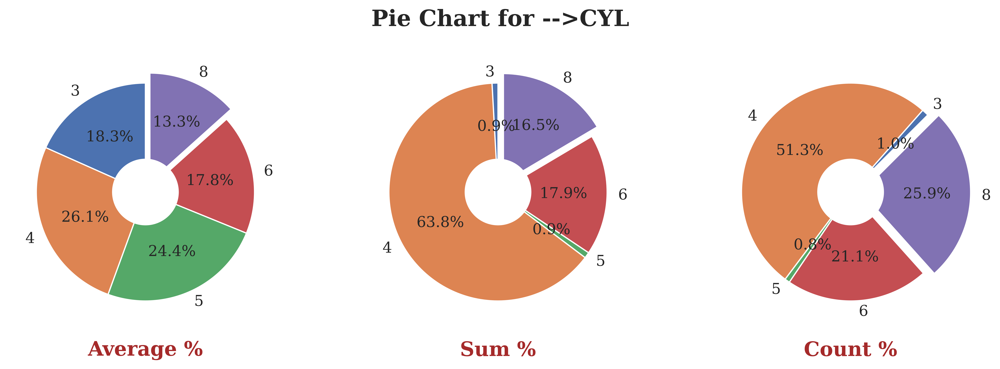

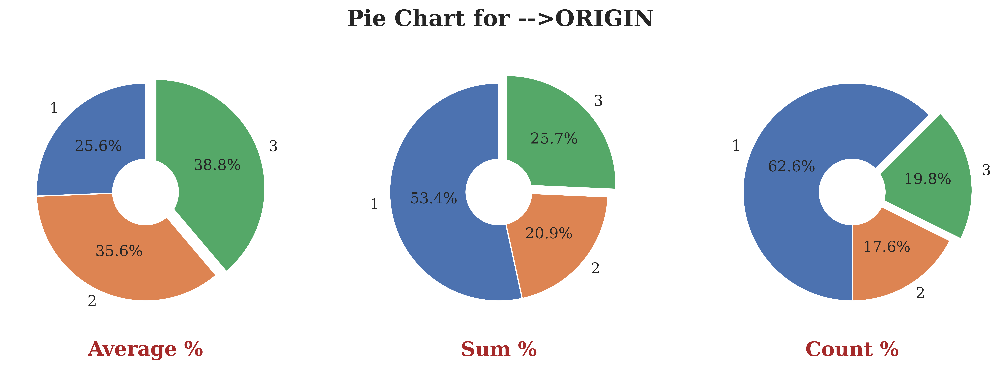

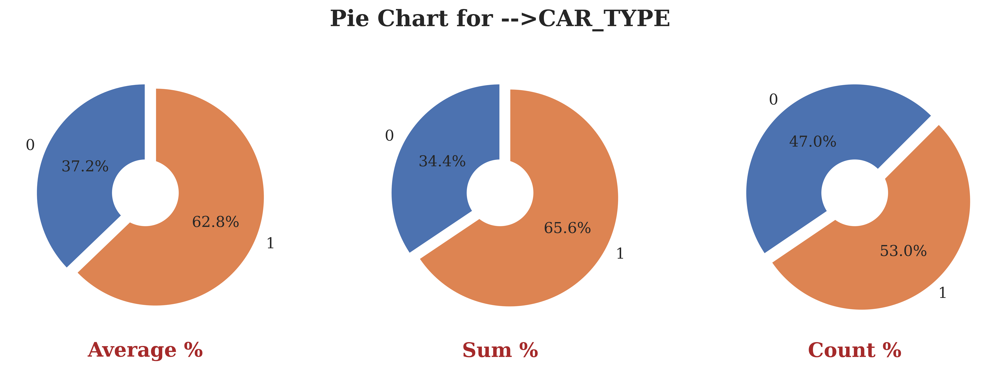

In [17]:
cat_cols = ['cyl','origin','car_type']
for catCol in cat_cols:
    bi_plots(df,catCol,"mpg")

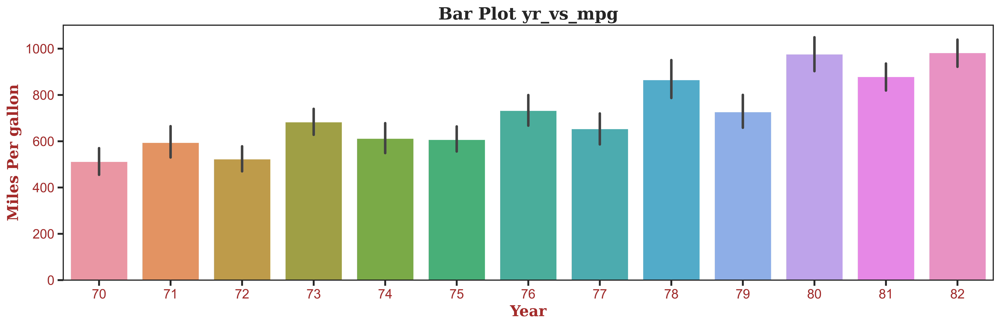

In [18]:
bar_plots(df,x = "yr", y = 'mpg')

In [19]:
#Pair Plot
cols = ['mpg','disp','hp_mod','wt','acc']
pair_plots(df, cols)

<Figure size 8000x8000 with 0 Axes>

C:\Users\91981\AppData\Local\Temp\ipykernel_10636\675035662.py:14: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr(method= method_)


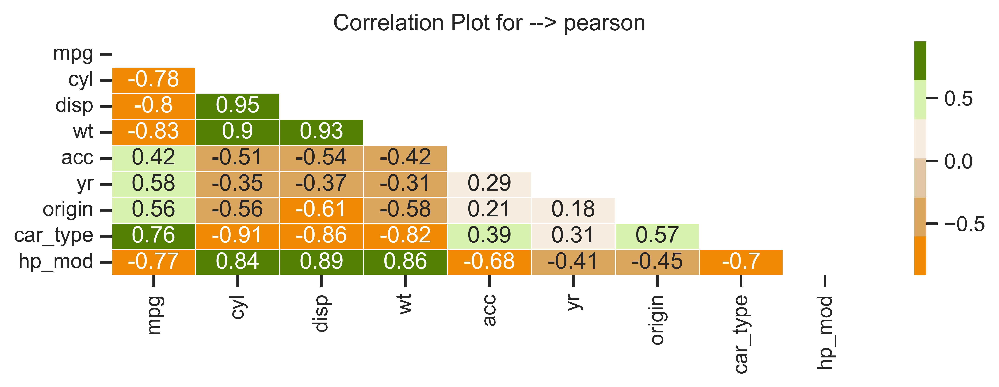

C:\Users\91981\AppData\Local\Temp\ipykernel_10636\675035662.py:14: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr(method= method_)


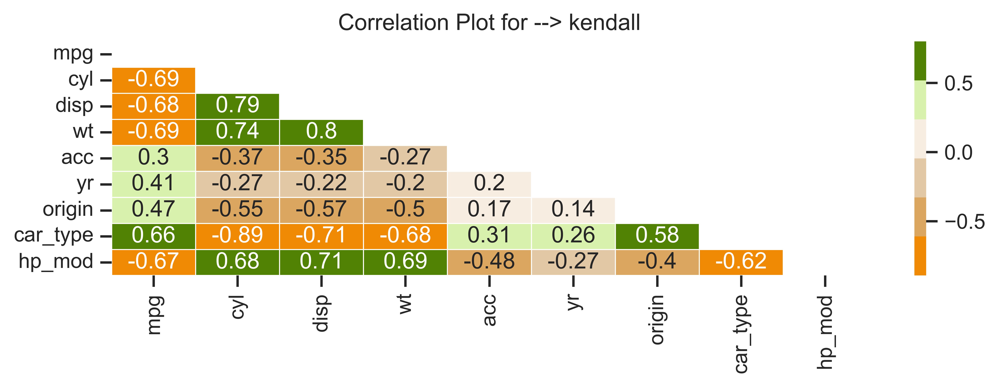

C:\Users\91981\AppData\Local\Temp\ipykernel_10636\675035662.py:14: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr(method= method_)


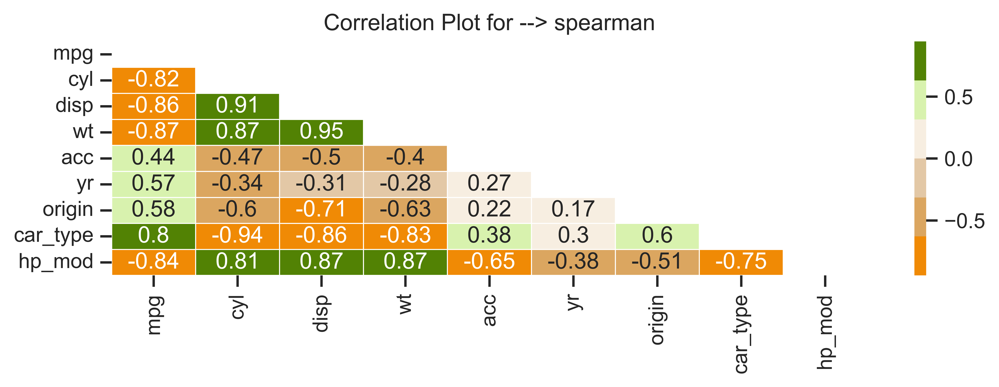

In [34]:
# Correlation Plot
cols = ['mpg','disp','hp_mod','wt','acc']
correlation_plot(df,method_= "pearson")
correlation_plot(df,method_= "kendall")
correlation_plot(df,method_= "spearman")

>Summary of Bi variate Analysis

* Engine Cylinders with 4 nos having highest average miles per gallon.
* Origin 1 and car type 1 has most say in data.
* `Strong correlation` between independant variables, and also strong `nonlinear` relation ship with target variable `mpg`.


### <p style="font-family:JetBrains Mono; font-weight:normal; letter-spacing: 3px; color:brown; font-size:100%; text-align:left;padding: 0px; border-bottom: 3px solid brown">2.5 Multi-variate Analysis</p>

<Figure size 12000x4000 with 0 Axes>

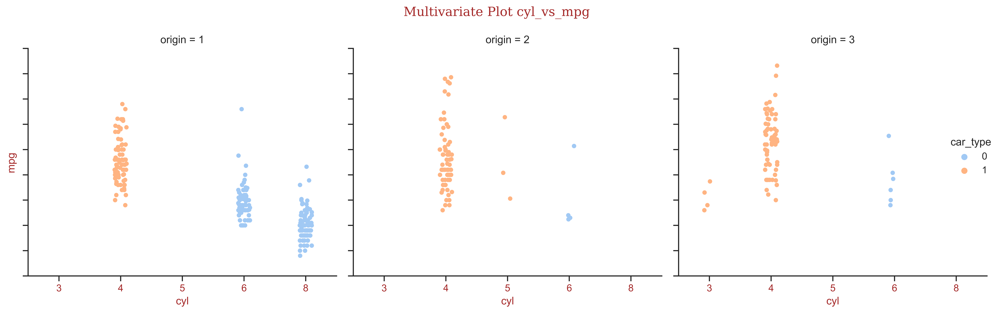

In [21]:
cat_plots(df, x="cyl",y="mpg",  col="origin", hue="car_type", kind='strip', palette='pastel')

>Summary of Multi variate Analysis

* Combination of cartype 1, origin 1,2,3 and cylinder 4 has most say when compared.
* Combination of origin 1,2,3 and cylinder 3,5 has least say when compared.
* Combination of origin 2,3 and cylinder 3,5,6,8 has least say when compared.


In [38]:
from sklearn.feature_selection import *
from sklearn.preprocessing import LabelEncoder

In [48]:
train = df.copy()
train.drop('hp', axis =1, inplace=True)
le = LabelEncoder()

for col in train.columns:
    if train[col].dtype == 'object':
        train[col] = le.fit_transform(train[col])
        

In [64]:
var_thresh = VarianceThreshold(0.3)
var_ = var_thresh.fit_transform(train)
var_thresh.get_support()

array([ True,  True,  True,  True,  True,  True,  True, False,  True,
        True])

In [71]:
train.var()

mpg             61.089611
cyl              2.893415
disp         10872.199152
wt          717140.990526
acc              7.604848
yr              13.672443
origin           0.643292
car_type         0.249718
car_name      8009.512582
hp_mod        1459.177916
dtype: float64

In [76]:
x_cols = [cols for cols in train.columns if cols not in ['mpg']]
X, y = train[x_cols], train['mpg']
f_reg =f_regression(X,y)
f_reg

(array([597.07704785, 724.99430337, 888.85068265,  84.95770025,
        199.98200802, 184.19963937, 538.83311725,  32.1270941 ,
        582.05610903]),
 array([4.50399225e-081, 1.65588891e-091, 2.97279956e-103, 1.82309154e-018,
        4.84493581e-037, 1.01148221e-034, 7.24364317e-076, 2.78531342e-008,
        9.25547753e-080]))

In [84]:
mut_reg = mutual_info_regression(X,y,n_neighbors=10, random_state=42)
mut_reg

array([0.63011177, 0.73319853, 0.7514076 , 0.1748143 , 0.31223067,
       0.22996177, 0.46150544, 0.11523172, 0.71095361])

In [ ]:
cat_cols = ['cyl','origin','car_type']

train_ch = train.copy()

train_ch['cyl'] = train_ch['cyl'].astype('object')
train_ch['origin'] = train_ch['origin'].astype('object')
train_ch['car_type'] = train_ch['car_type'].astype('object')